#### KBL OPS Modeling

- 종속변수 : OPS
- 독립변수 : 선택 중
- 자료 : statiz 시즌 기록실(2010~2018) & dacon 제공 자료
- 참고 : dacon.io

### 데이터 삭제 
투수 기록을 가져와도 타자를 가져 오는 경우가 존재

-  1. 포지션이 없는 경우 (엑셀 기준 -> 팀, 포지션(NA 삭제))
    - 은퇴 선수, 2019에 엔트리 말소 발생 경우 -> 하나하나 확인
장종덕	유영준	이창섭	김승회	이승진	양원혁	강구성	김광현	주현상	윤중환	임한용	문성주	김철호	김영환	이재근	박세웅	김기현	김인환

-  2. 투수 삭제
    - 포지션 P
특이사항 넥센 김상수 2있지만 삭제는 투수 데이터임. 김민우

-  3. 문제
    - 일부 데이터 누락 
        - 이대호(12~18)
        - 다른 경우도 존재할 듯...ㅠㅠ

In [40]:
import missingno as msno
import pprint

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import time
from datetime import datetime

#pd.set_option('display.max_rows', 40) # 행 늘리고 싶을 때..
pd.set_option("display.max_columns", None) # 열 길게 보고 싶을 때...

In [41]:
# to_csv(' ', encoding='euc-kr') 을 한 경우 파일을 불러올때 engine='python' 필수
# rs1 -> regular season first 라는 의미
rs1 = pd.read_csv('statiz_origin_wr_wr.csv', engine='python')
rs1.rename(columns={"2타":"타2","3타":"타3","wRC+":"wRC", "WAR+":"WAR"},inplace=True)

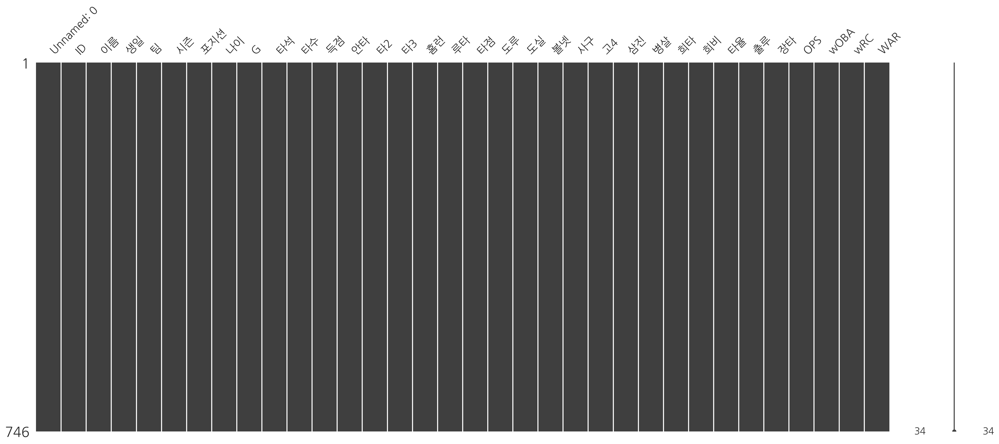

In [4]:
msno.matrix(rs1);

In [5]:
# 결측값은 없다.........
rs1.isnull().sum()

Unnamed: 0    0
ID            0
이름            0
생일            0
팀             0
시즌            0
포지션           0
나이            0
G             0
타석            0
타수            0
득점            0
안타            0
타2            0
타3            0
홈런            0
루타            0
타점            0
도루            0
도실            0
볼넷            0
사구            0
고4            0
삼진            0
병살            0
희타            0
희비            0
타율            0
출루            0
장타            0
OPS           0
wOBA          0
wRC           0
WAR           0
dtype: int64

In [6]:
# 쓸데없는 변수가 있어 보인다. 새로 하나 만들자.
# 변수 앞에 숫자 뒤에 문자가 아닌 것이 들어가는 경우 회귀분석이 되지 않으니 데이터 전처리 후 변경하자.
rs1.columns

Index(['Unnamed: 0', 'ID', '이름', '생일', '팀', '시즌', '포지션', '나이', 'G', '타석', '타수',
       '득점', '안타', '타2', '타3', '홈런', '루타', '타점', '도루', '도실', '볼넷', '사구', '고4',
       '삼진', '병살', '희타', '희비', '타율', '출루', '장타', 'OPS', 'wOBA', 'wRC', 'WAR'],
      dtype='object')

In [7]:
col1 = ['타석', '타수',
       '득점', '안타', '타2', '타3', '홈런', '루타', '타점', '도루', '도실', '볼넷', '사구', '고4',
       '삼진', '병살', '희타', '희비', '타율', '출루', '장타', 'OPS', 'wOBA', 'wRC', 'WAR']

In [8]:
# 전체 변수 scatterplot 이다.
# 저 많은 변수를 scatterplot으로 그리면 제대로나 볼 수 있을까? 전체적으로 파악 하고 싶으면 보기!
# sns.pairplot(rs1[col1])

In [9]:
# 상관계수 보기. 첫번째는 OPS라 1부터~~ 장타와 출루는 OPS 와 밀접한 관련이 있으므로 빼야한다~
rs1[col1].corr()['OPS'].sort_values(ascending=False)[1:11]

wOBA    0.989398
장타      0.970962
출루      0.951141
타율      0.941874
wRC     0.907829
루타      0.548311
타점      0.538753
안타      0.533494
타석      0.522788
볼넷      0.519023
Name: OPS, dtype: float64

##### test, train 분리하기.
- 아래의 방법보다 깔끔하게 그리는 법이 있을거다..

In [10]:
# 시즌 분류하기 2010~ 2017
train = rs1[(rs1['시즌'] == 2010) | (rs1['시즌'] == 2011) | (rs1['시즌'] == 2012) | (rs1['시즌'] == 2013) | (rs1['시즌'] == 2014) | (rs1['시즌'] == 2015) | (rs1['시즌'] == 2016) | (rs1['시즌'] == 2017)] 
test = rs1[(rs1['시즌'] == 2018) ]
other= rs1[(rs1['시즌'] == 2019) ]
# 데이터 잘 들어갔는지 검증
len(train) + len(test) + len(other) - len(rs1)

0

In [11]:
# KIA와 KT의 저주.. K가 하나만....
# statiz 데이터에서는 색깔로 구분 되어있다....
# 일단 해결방법은 dacon 데이터랑 매치해서 해주면 될듯.
# 동명이인 -> 생일도 고려해서.. 생일도 같지는 않겠지...? 그때가서 생각. 수기로 넣던가................
train[(train['팀'] == 'K')].head()

,Unnamed: 0,ID,이름,생일,팀,시즌,포지션,나이,G,타석,타수,득점,안타,타2,타3,홈런,루타,타점,도루,도실,볼넷,사구,고4,삼진,병살,희타,희비,타율,출루,장타,OPS,wOBA,wRC,WAR
20,20,5,최형우,1983-12-16,K,2017,LF,35,142,629,514,98,176,36,3,26,296,120,0,1,96,11,8,82,15,0,8,0.342,0.450,0.576,1.026,0.442,163.5,6.66
36,36,20,안치홍,1990-07-02,K,2014,2B,25,126,479,434,65,147,31,2,18,236,88,19,6,33,6,1,65,11,2,4,0.339,0.390,0.544,0.934,0.408,133.4,4.55
42,42,24,이용규,1985-08-26,K,2012,CF,28,125,580,491,86,139,14,2,2,163,37,44,12,66,10,0,38,9,10,3,0.283,0.377,0.332,0.709,0.340,111.3,4.50
49,49,20,안치홍,1990-07-02,K,2017,2B,28,132,545,487,95,154,29,2,21,250,93,7,0,43,4,1,70,19,6,5,0.316,0.373,0.513,0.886,0.382,123.0,4.39
52,52,31,이범호,1981-11-25,K,2016,3B,36,138,560,484,93,150,23,0,33,272,108,1,1,60,9,7,57,15,0,7,0.310,0.391,0.562,0.953,0.411,132.9,4.36


##### 개별 변수 - train 관련

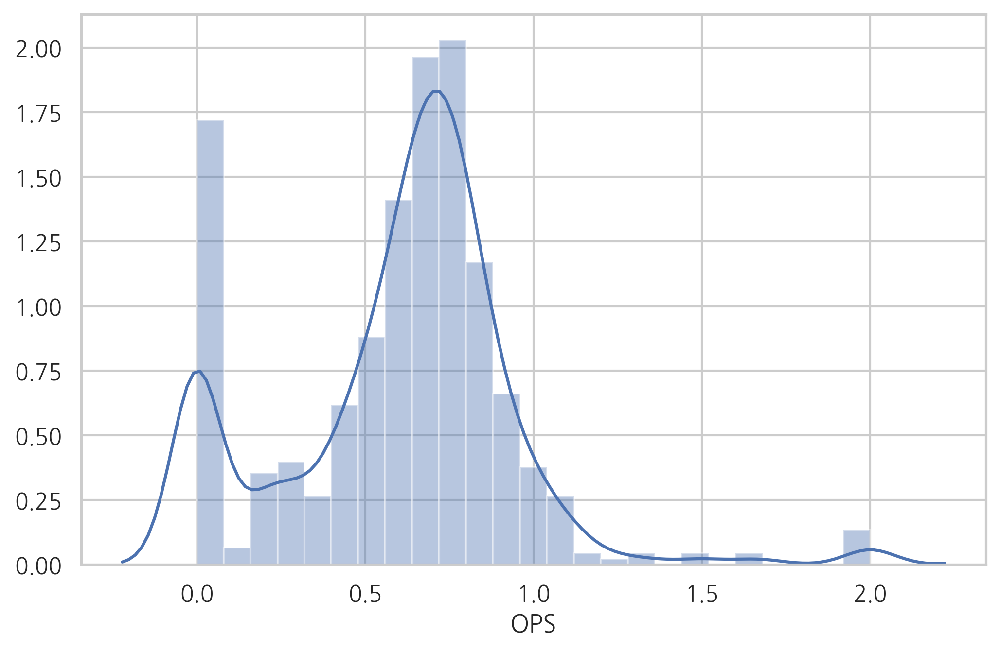

In [12]:
# OPS
#plt.figure(figsize=(4,4))
sns.distplot(train['OPS'])

plt.show()

- OPS의 값이 0이 많다
    - 데이터 처리 과정에서 NaN 데이터를 전부 0으로 처리한 경우
    - 타석에 섰으나 OPS 계산 과정에서 0이 되는경우
- OPS 값이 2인 경우
    - 타석에 적은 횟수를 서서 계산 과정 변수가 최대값으로 되는 경우
    - 정말 잘하는 경우

- 처리 방법 - 논의 필요, 내 의견
    - 일정 타석 이상 선 선수만 선택
    - 일정 타수 이상 친 선수만 선택

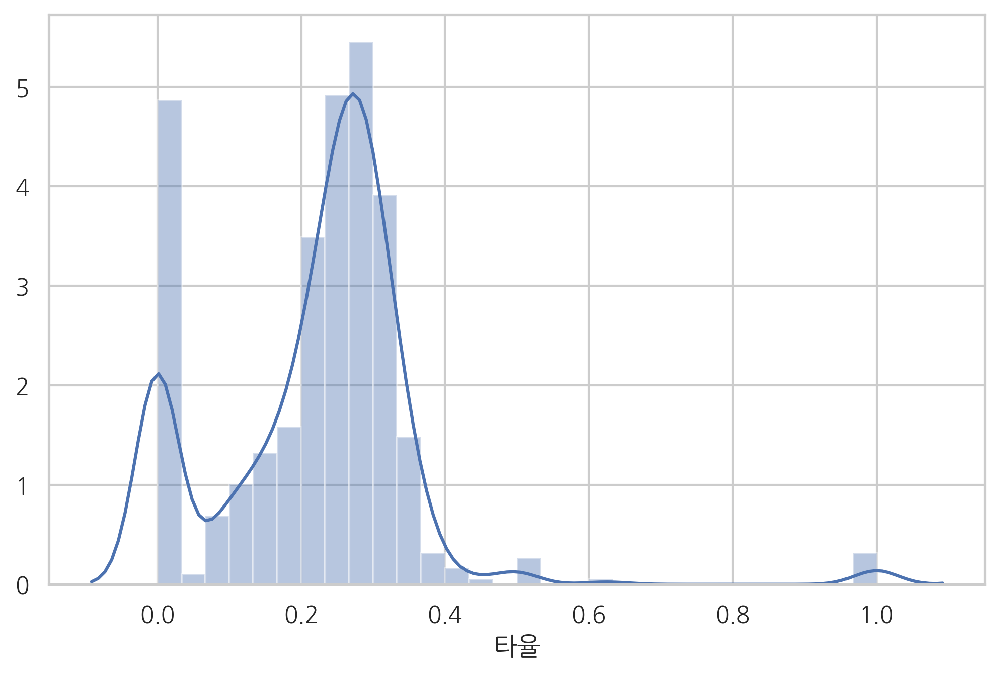

In [13]:
sns.distplot(train['타율'])
plt.show()

- 타율도 OPS와 같은 관점에서 처리하기

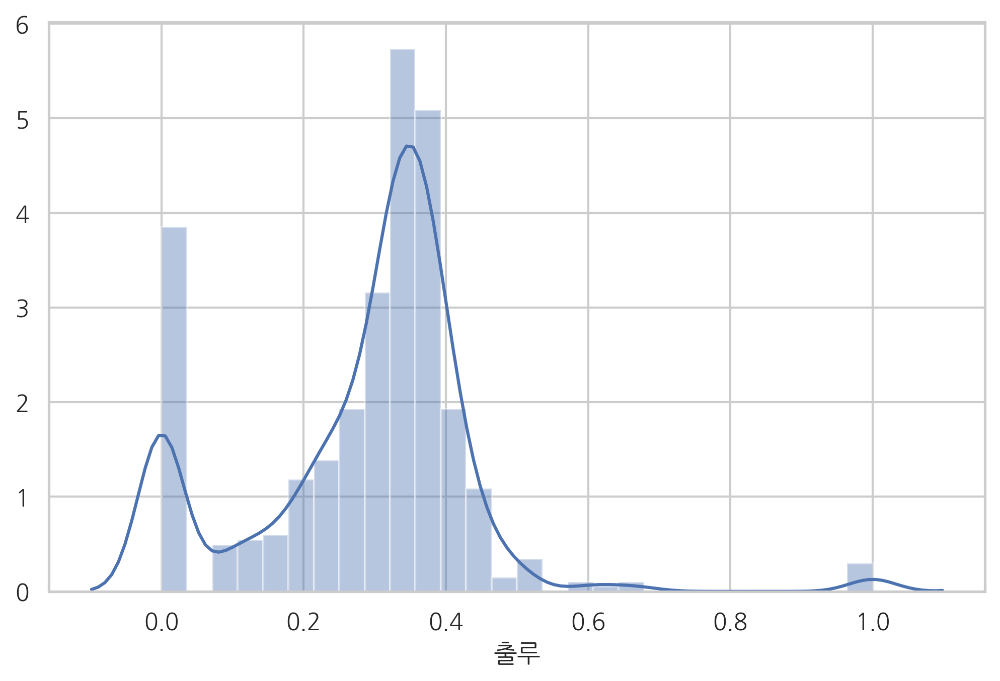

In [14]:
sns.distplot(train['출루'])
plt.show()

- 출루율
    - 아무것도 못치는 경우...ㅠ
    
- 타석 횟수로 거르던가..
- 그래도 0이 나온다면..?

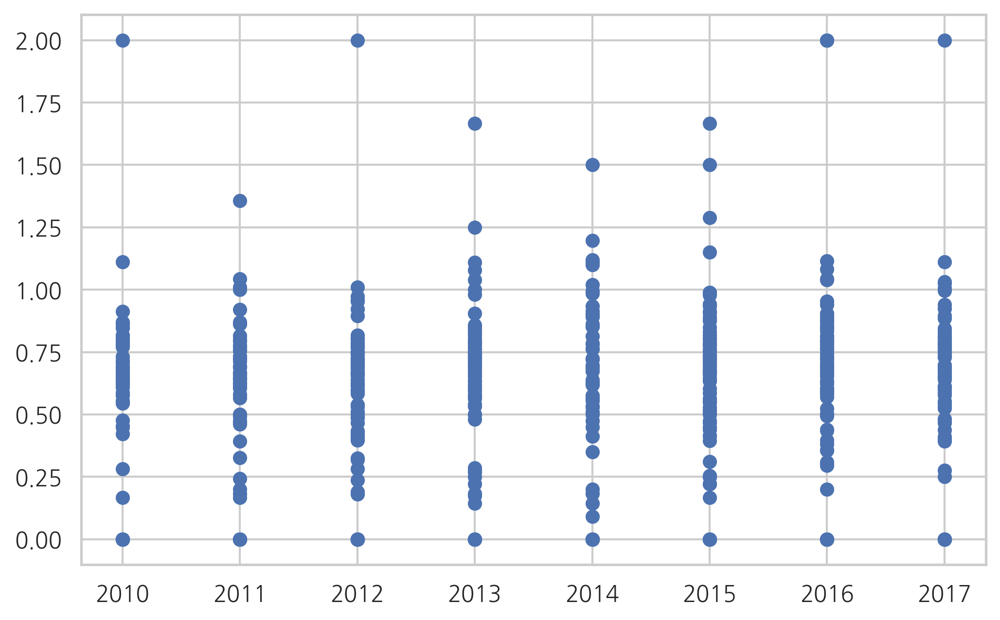

In [15]:
plt.scatter(train['시즌'],train['OPS']);

- 위에서 적었지만 OPS가 2인 경우는 살펴보고 제외하던가..

In [16]:
#pd.set_option('display.max_columns', 40)
train[(train['시즌']==2010) & (train['OPS']==2)]

,Unnamed: 0,ID,이름,생일,팀,시즌,포지션,나이,G,타석,타수,득점,안타,타2,타3,홈런,루타,타점,도루,도실,볼넷,사구,고4,삼진,병살,희타,희비,타율,출루,장타,OPS,wOBA,wRC,WAR
397,398,226,장태성,1986-12-15,K,2010,3B,25,3,1,1,0,1,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1.0,1.0,1.0,2.0,0.944,503.5,0.05


In [17]:
train['OPS'].describe() # 이렇다고 한다..

count    567.000000
mean       0.601868
std        0.344594
min        0.000000
25%        0.450000
50%        0.666000
75%        0.784000
max        2.000000
Name: OPS, dtype: float64

In [18]:
test.columns

Index(['Unnamed: 0', 'ID', '이름', '생일', '팀', '시즌', '포지션', '나이', 'G', '타석', '타수',
       '득점', '안타', '타2', '타3', '홈런', '루타', '타점', '도루', '도실', '볼넷', '사구', '고4',
       '삼진', '병살', '희타', '희비', '타율', '출루', '장타', 'OPS', 'wOBA', 'wRC', 'WAR'],
      dtype='object')

#### 회귀분석
- 아무 변수도 수정하지 않고 돌려보자..
- R square 도 높을거고 뭐 말도 안되는 결과가 나올거다.
- 출루와 장타가 OPS의 구성 요소인데 이것을 넣으니
- 자기 상관도 높을거고.
- 어떻게 처리해야할지 보는 단계!

In [ ]:
col2 = ['타석', '타수',
       '득점', '안타', '타2', '타3', '홈런', '루타', '타점', '도루', '도실', '볼넷', '사구', '고4',
       '삼진', '병살', '희타', '희비', '타율', '출루', '장타', 'OPS', 'wOBA', 'wRC', 'WAR']

In [19]:
dfx=train[['타석', '타수',
       '득점', '안타', '타2', '타3', '홈런', '루타', '타점', '도루', '도실', '볼넷', '사구', '고4',
       '삼진', '병살', '희타', '희비', '타율', '출루', '장타', 'OPS', 'wOBA', 'wRC', 'WAR']]

In [20]:
dfy = train['OPS']

In [21]:
model = sm.OLS.from_formula('OPS ~ 타석 + 타수 + 득점 + 타2 + 타3+ 안타  + 루타 + 타점 + 도루 + 도실 + 볼넷 + 삼진 + 병살 + 희타 + 희비 + 타율 + wOBA + wRC + WAR ', data = train)
result_train = model.fit()
print(result_train.summary())

                            OLS Regression Results                            
Dep. Variable:                    OPS   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.987
Method:                 Least Squares   F-statistic:                     2260.
Date:                Mon, 30 Mar 2020   Prob (F-statistic):               0.00
Time:                        03:06:40   Log-Likelihood:                 1040.6
No. Observations:                 567   AIC:                            -2041.
Df Residuals:                     547   BIC:                            -1954.
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0132      0.005      2.655      0.0

- 채택 가능한 변수가 많지 않다... 일단 조건수가 너무 높다...
- covariance를 robust 하게 바꾼다면 어떠려나..?
    - robust는 변수의 이상치 처리 시 사용하는 개념.
    
- VIF는 이번 단계에서는 건너뛰고.. 혹시 필요하면 얘기해서 해보기

##### RMSE

( Root Mean Squared Error )

표준편차와 동일하다. 특정 수치에 대한 예측의 정확도를 표현할 때, Accuracy로 판단하기에는 정확도를 올바르게 표기할 수 없어, RMSE 수치로 정확도 판단을 하곤 한다. 일반적으로 해당 수치가 낮을수록 정확도가 높다고 판단한다


In [23]:
from sklearn.metrics import mean_squared_error

RMSE = mean_squared_error(test['OPS'], result_train.predict(test))**0.5
RMSE
# 값이 생각보다 잘 나왔다... 여기서 끝내면 안될까..?

0.025839958665183016

### 변수 생성

##### 변수를 추가하여 회귀 모델의 성능을 개선 시키기
- r-square값을 조금 떨어뜨리면서
- 채택되는 변수는 많게
- 조건수는 낮게 만들어 조건수 경고가 뜨지 않도록

- 새 변수 추가
    - 1루타 - 안타에 포함되어 있어서 1루타를 따로 계산할 필요가 있음, 본 분석에서는 타1
    - 운 - 운도 많이 작용. 세부 식은 계산하면서 보기
    - 지표 변동성 - 선수가 매년 일정한 성적을 내는게 아니니까. 전전년도 데이터로 전년도 계산한다. 세부식 보기

In [42]:
# 다시 확인. rs1 데이터에서 변수 추가 하고 test, train 분리
rs1

,Unnamed: 0,ID,이름,생일,팀,시즌,포지션,나이,G,타석,타수,득점,안타,타2,타3,홈런,루타,타점,도루,도실,볼넷,사구,고4,삼진,병살,희타,희비,타율,출루,장타,OPS,wOBA,wRC,WAR
0,0,0,테임즈,1986-11-10,N,2015,1B,30,142,595,472,130,180,42,5,47,373,140,40,8,103,13,11,91,7,0,7,0.381,0.498,0.790,1.288,0.530,222.3,10.71
1,1,1,이대호,1982-06-21,롯,2010,3B,29,127,552,478,99,174,13,0,44,319,133,0,2,61,10,6,77,15,0,3,0.364,0.444,0.667,1.111,0.482,192.4,8.82
2,2,2,강정호,1987-04-05,넥,2012,SS,26,124,519,436,77,137,32,0,25,244,82,21,5,71,6,8,78,16,1,5,0.314,0.413,0.560,0.973,0.438,179.8,8.23
3,3,2,강정호,1987-04-05,넥,2014,SS,28,117,501,418,103,149,36,2,40,309,117,3,3,68,13,2,106,8,0,2,0.356,0.459,0.739,1.198,0.500,185.6,8.05
4,4,3,박석민,1985-06-22,삼,2012,3B,28,127,549,443,79,138,19,3,23,232,91,2,3,72,27,5,83,8,2,5,0.312,0.433,0.524,0.957,0.438,179.9,7.89
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
741,955,83,김주형,1985-12-15,K,2011,1B,27,88,300,271,23,54,14,0,9,95,40,1,0,17,4,0,71,6,7,1,0.199,0.256,0.351,0.607,0.275,58.9,-0.66
742,956,167,정주현,1990-10-13,L,2016,2B,27,99,257,225,30,50,12,1,1,67,22,5,5,28,0,0,66,1,2,2,0.222,0.306,0.298,0.604,0.287,52.5,-0.67
743,957,492,오윤석,1992-02-24,롯,2019,1B,28,76,228,198,21,44,2,0,1,49,21,0,0,20,2,1,43,4,4,4,0.222,0.295,0.247,0.542,0.258,49.6,-0.67
744,958,72,윤석민,1985-09-04,K,2019,1B,35,63,178,169,4,39,4,0,2,49,17,0,0,7,0,0,24,4,0,2,0.231,0.258,0.290,0.548,0.256,47.6,-0.67


In [43]:
rs1.columns # 잘 변해있다.

Index(['Unnamed: 0', 'ID', '이름', '생일', '팀', '시즌', '포지션', '나이', 'G', '타석', '타수',
       '득점', '안타', '타2', '타3', '홈런', '루타', '타점', '도루', '도실', '볼넷', '사구', '고4',
       '삼진', '병살', '희타', '희비', '타율', '출루', '장타', 'OPS', 'wOBA', 'wRC', 'WAR'],
      dtype='object')

In [44]:
# 1루 생성, 2,3루 이름 변경 
# 숫자가 앞에 가면 OLS가 작동하지 않음
#rs1.rename(columns={"2타":"타2","3타":"타3",},inplace=True)
rs1['타1'] = rs1['안타'] - rs1['타2'] - rs1['타3'] - rs1['홈런']


In [45]:
# 운 지표
# 2루타를 얼마나 많이 치느냐를 본다.
# 데이콘 변수는 영어라 이전에 만들어 둔 자료 한글로 변경.
# 논문에서 가져옴. -> 출처 명시 
#regular_season_Batter['towB_LUCK'] = regular_season_Batter['2B']/(regular_season_Batter['AB'] - regular_season_Batter['HR'] - regular_season_Batter['SO'])
rs1['운'] = rs1['타2']/(rs1['타수'] - rs1['홈런'] - rs1['삼진'])

In [46]:
# 지표 변동성 - 지표 이해는 잘 못하고 붙여다 쓰고 있음
# 출처 : https://musma.github.io/2019/05/15/make-a-prediction3.html
# 근데 식을 저렇게 짜면 NaN이 나올텐데..?

평타1타 = []
평타2타 = []
평타3타 = []
평타총평 = [] # 타수 총 평균
평타루타 = []
펑타출루 = []
for i in range(len(rs1)):
    df = rs1.loc[(rs1['이름']==rs1['이름'].iloc[i])&(rs1['시즌']<rs1['시즌'].iloc[i])]
    평타1타.append(df['타1'].sum()/df['타수'].sum())
    평타2타.append(df['타2'].sum()/df['타수'].sum())
    평타3타.append(df['타3'].sum()/df['타수'].sum())
    평타총평.append(df['타수'].sum()/len(df))
    평타루타.append(df['출루'].sum()/len(df))
    펑타출루.append((df['타율']*df['타수']).sum()/df['타수'].sum())

rs1['평타1타'] = 평타1타
rs1['평타2타'] = 평타2타
rs1['평타3타'] = 평타3타
rs1['평타총평'] = 평타총평
rs1['평타루타'] = 평타루타
rs1['펑타출루'] = 펑타출루

In [47]:
# 드롭하기로 한 변수. 일단은 살려두고 진행 중...
#rs1 = rs1.drop(columns=['출루', '장타', '안타'])

In [48]:
rs1.columns

Index(['Unnamed: 0', 'ID', '이름', '생일', '팀', '시즌', '포지션', '나이', 'G', '타석', '타수',
       '득점', '안타', '타2', '타3', '홈런', '루타', '타점', '도루', '도실', '볼넷', '사구', '고4',
       '삼진', '병살', '희타', '희비', '타율', '출루', '장타', 'OPS', 'wOBA', 'wRC', 'WAR',
       '타1', '운', '평타1타', '평타2타', '평타3타', '평타총평', '평타루타', '펑타출루'],
      dtype='object')

In [49]:
# 변수 순서 변경
rs1 =rs1[['Unnamed: 0', 'ID', '이름', '생일', '팀', '시즌', '포지션', '나이', 'G', '타석', '타수',
       '득점', '안타','타1', '타2', '타3', '홈런', '루타', '타점', '도루', '도실', '볼넷', '사구', '고4',
       '삼진', '병살', '희타', '희비', '타율', '출루', '장타', 'OPS', 'wOBA', 'wRC', 'WAR', '운', '평타1타', '평타2타', '평타3타', '평타총평', '평타루타', '펑타출루']]

In [52]:
# train, test 분리 (2010~2017)
# test(2018)
train = rs1[(rs1['시즌'] == 2010) | (rs1['시즌'] == 2011) | (rs1['시즌'] == 2012) | (rs1['시즌'] == 2013) | (rs1['시즌'] == 2014) | (rs1['시즌'] == 2015) | (rs1['시즌'] == 2016) | (rs1['시즌'] == 2017)] 
test = rs1[rs1['시즌'] == 2018]

In [53]:

col_test = ['ID', '이름', '생일', '팀', '시즌', '포지션', '나이', 'G', '타석', '타수',
       '득점', '타1', '타2', '타3', '홈런', '루타', '타점', '도루', '도실', '볼넷', '사구',
       '고4', '삼진', '병살', '희타', '희비', '타율', 'OPS', 'wOBA', 'wRC',
       'WAR', '운', '평타1타', '평타2타', '평타3타', '평타총평', '평타루타', '펑타출루']
col_train = ['ID', '이름', '생일', '팀', '시즌', '포지션', '나이', 'G', '타석', '타수',
       '득점', '타1', '타2', '타3', '홈런', '루타', '타점', '도루', '도실', '볼넷', '사구',
       '고4', '삼진', '병살', '희타', '희비', '타율', 'OPS', 'wOBA', 'wRC',
       'WAR', '운', '평타1타', '평타2타', '평타3타', '평타총평', '평타루타', '펑타출루']
col_summary = ['시즌','나이', 'G', '타석', '타수',
       '득점', '타1', '타2', '타3', '홈런', '루타', '타점', '도루', '도실', '볼넷', '사구',
       '고4', '삼진', '병살', '희타', '희비', '타율', 'OPS', 'wOBA', 'wRC',
       'WAR', '운', '평타1타', '평타2타', '평타3타', '평타총평', '평타루타', '펑타출루']

In [56]:
train.corr()['OPS'].sort_values(ascending=False)[1:11] # 출루, 장타, 안타 제외!
# wRc 도 OPS 랑 직접 관련이 있을 것 같다..ㅠ 루타 타점 등등이 쓸만하려나..?

wOBA    0.988565
장타      0.968644
출루      0.947139
타율      0.937596
wRC     0.912584
루타      0.513268
타점      0.504015
안타      0.496783
WAR     0.486278
볼넷      0.486053
Name: OPS, dtype: float64

In [55]:
train[col_summary].describe()

,시즌,나이,G,타석,타수,득점,타1,타2,타3,홈런,루타,타점,도루,도실,볼넷,사구,고4,삼진,병살,희타,희비,타율,OPS,wOBA,wRC,WAR,운,평타1타,평타2타,평타3타,평타총평,평타루타,펑타출루
count,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,567.000000,552.000000,238.000000,238.000000,238.000000,239.000000,239.000000,238.000000
mean,2013.708995,28.853616,62.906526,199.740741,173.266314,26.320988,34.696649,8.539683,0.850088,4.643739,72.901235,24.294533,4.964727,2.081129,19.049383,2.858907,0.710758,33.426808,3.880071,2.973545,1.589065,0.221473,0.601868,0.276026,63.952910,0.994092,0.052466,0.174613,0.038504,0.004276,198.339609,0.289160,0.226710
std,2.240403,4.748228,47.520575,200.807798,173.455439,30.304683,37.758949,10.098180,1.698189,8.441865,85.231326,30.792702,9.413292,3.227605,22.502085,3.995296,1.832454,33.125863,4.518483,4.371568,2.187845,0.141156,0.344594,0.153818,86.444545,1.853296,0.062318,0.095219,0.038372,0.007077,167.378701,0.134229,0.115106
min,2010.000000,19.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-136.600000,-0.680000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2012.000000,25.000000,15.000000,20.000000,18.000000,2.000000,2.000000,0.000000,0.000000,0.000000,4.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,5.000000,0.000000,0.000000,0.000000,0.154000,0.450000,0.209500,0.000000,-0.090000,0.000000,0.141095,0.022222,0.000000,28.500000,0.245500,0.190030
50%,2014.000000,28.000000,59.000000,108.000000,99.000000,13.000000,17.000000,4.000000,0.000000,1.000000,32.000000,10.000000,1.000000,1.000000,10.000000,1.000000,0.000000,21.000000,2.000000,1.000000,1.000000,0.250000,0.666000,0.307000,72.400000,0.110000,0.052632,0.186560,0.040900,0.000000,171.000000,0.328500,0.250952
75%,2016.000000,32.000000,110.000000,363.000000,311.000000,42.500000,63.000000,14.000000,1.000000,5.000000,117.500000,39.000000,5.000000,3.000000,32.000000,4.000000,1.000000,56.000000,6.000000,4.000000,3.000000,0.292500,0.784000,0.358500,107.600000,1.380000,0.072637,0.212875,0.052603,0.006641,347.000000,0.367000,0.289941
max,2017.000000,43.000000,144.000000,654.000000,600.000000,135.000000,174.000000,46.000000,17.000000,53.000000,377.000000,146.000000,65.000000,20.000000,103.000000,27.000000,15.000000,161.000000,22.000000,23.000000,12.000000,1.000000,2.000000,0.955000,543.300000,10.710000,1.000000,1.000000,0.500000,0.052632,544.500000,1.000000,1.000000


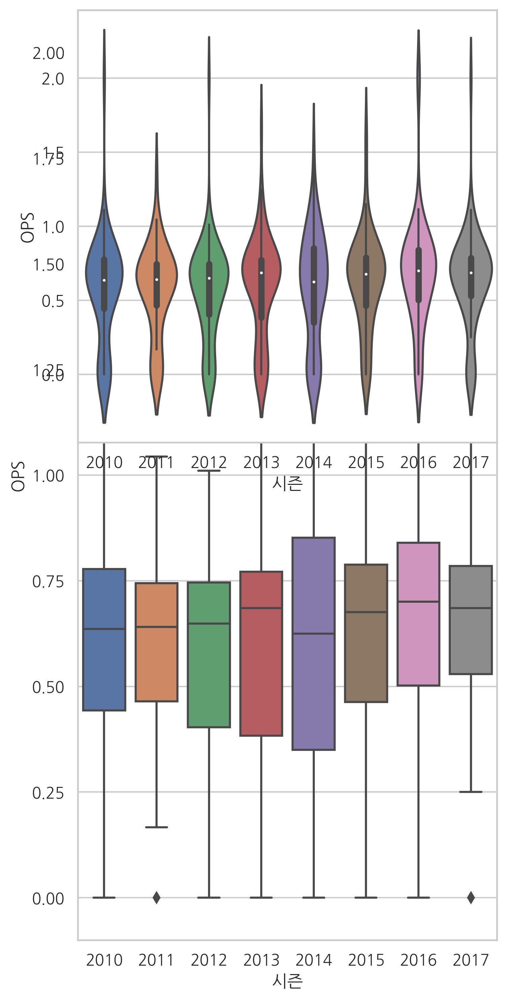

In [57]:
# plotly 가 더 깔끔할듯..
#sns.boxplot(x='시즌', y='OPS', hue='포지션',data=train)
fig = plt.figure(figsize=(10,10))
ax1 = fig.add_subplot(1, 2, 2)
ax2 = fig.add_subplot(2, 2, 2)
#ax3 = fig.add_subplot(2, 2, 3)
#ax4 = fig.add_subplot(2, 2, 4)

sns.boxplot(x='시즌', y='OPS', data = train, ax=ax1)
sns.violinplot(x='시즌', y='OPS', data =train, ax=ax2)

plt.tight_layout()
plt.show()

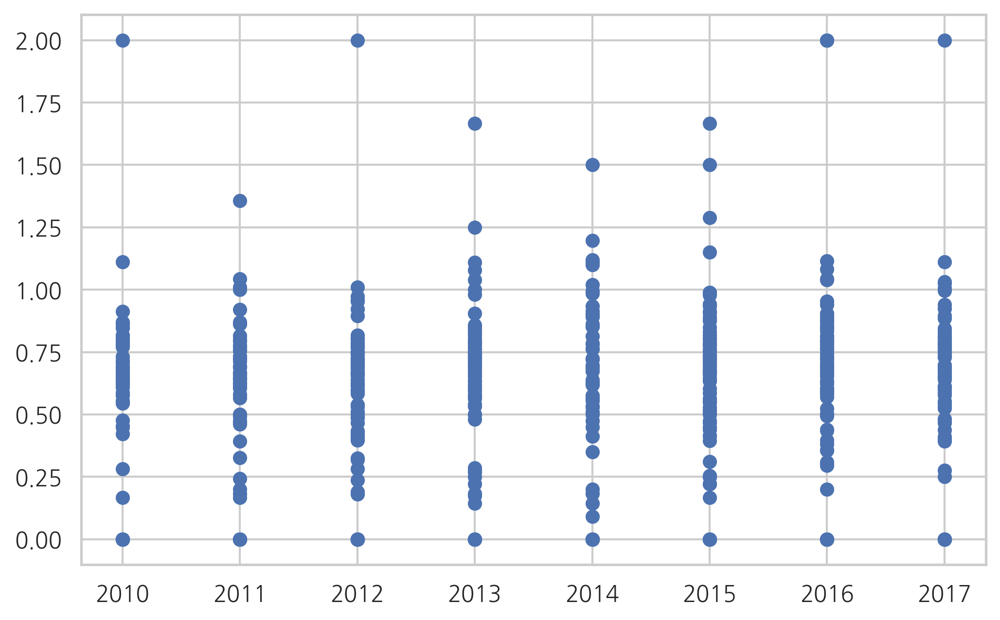

In [58]:
plt.scatter(train['시즌'],train['OPS'])
# 아까 본거니... 써보고 싶었음..

In [ ]:
# plotly 인스톨
!pip install plotly
!pip install chart-studio
!pip install cufflinks

In [ ]:
# 전체 -> 돌리지 않는게 좋다.
sns.pairplot(train[['시즌','G', '타석', '타수', '출루', '장타', '안타',
           '타1', '타2', '타3', '홈런', '타점', '도루', '도실', '볼넷', '사구', '고4',
            '삼진', '병살', '희타', '희비', 
            '타율', 'wOBA', 
            '운' , 'OPS']],


    diag_kind = 'kde') 

plt.show()

# 이걸 어떻게 보냐... 상관관계 계수만 높여서 보자... 
# 2017년에 타수가 튀는 값이 보인다.
# 개별적으로 나눠서 봐보자...

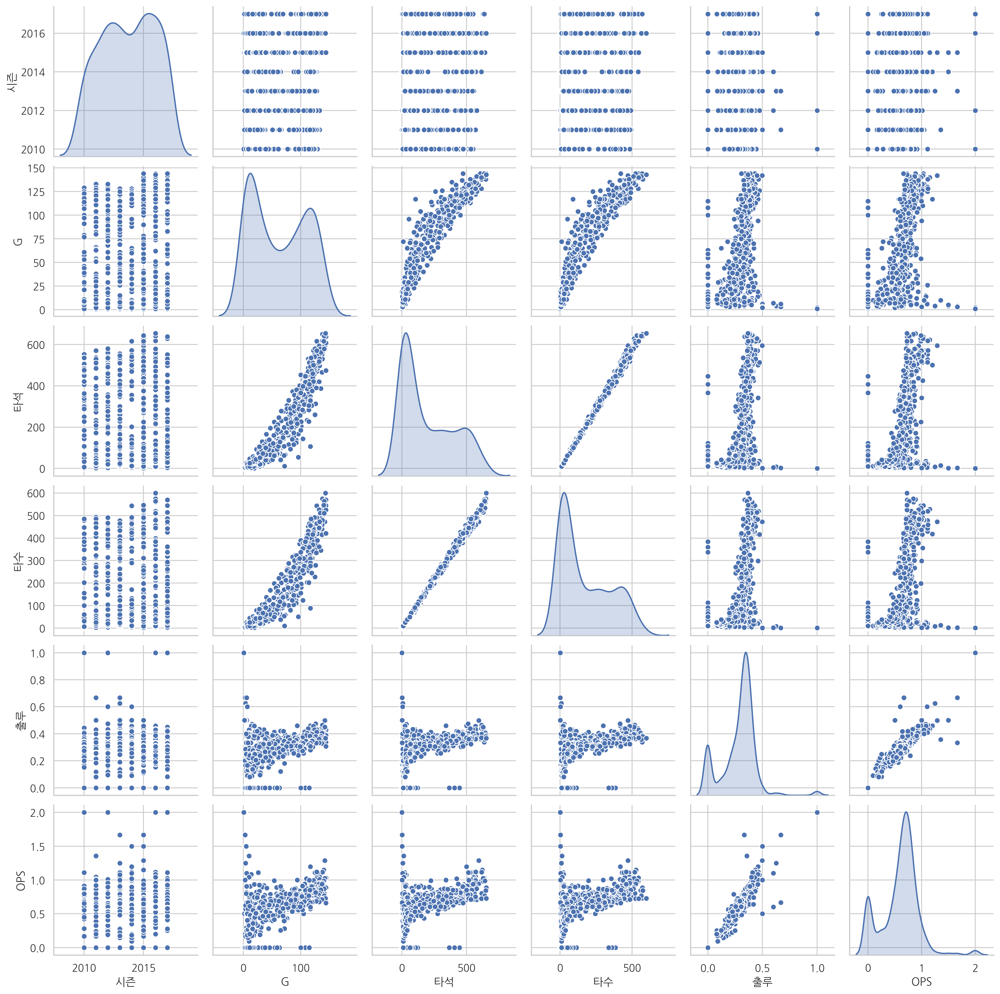

In [59]:
# 시즌과 OPS는 유지
sns.pairplot(train[['시즌','G', '타석', '타수', '출루', 'OPS']], diag_kind = 'kde') 

plt.show()

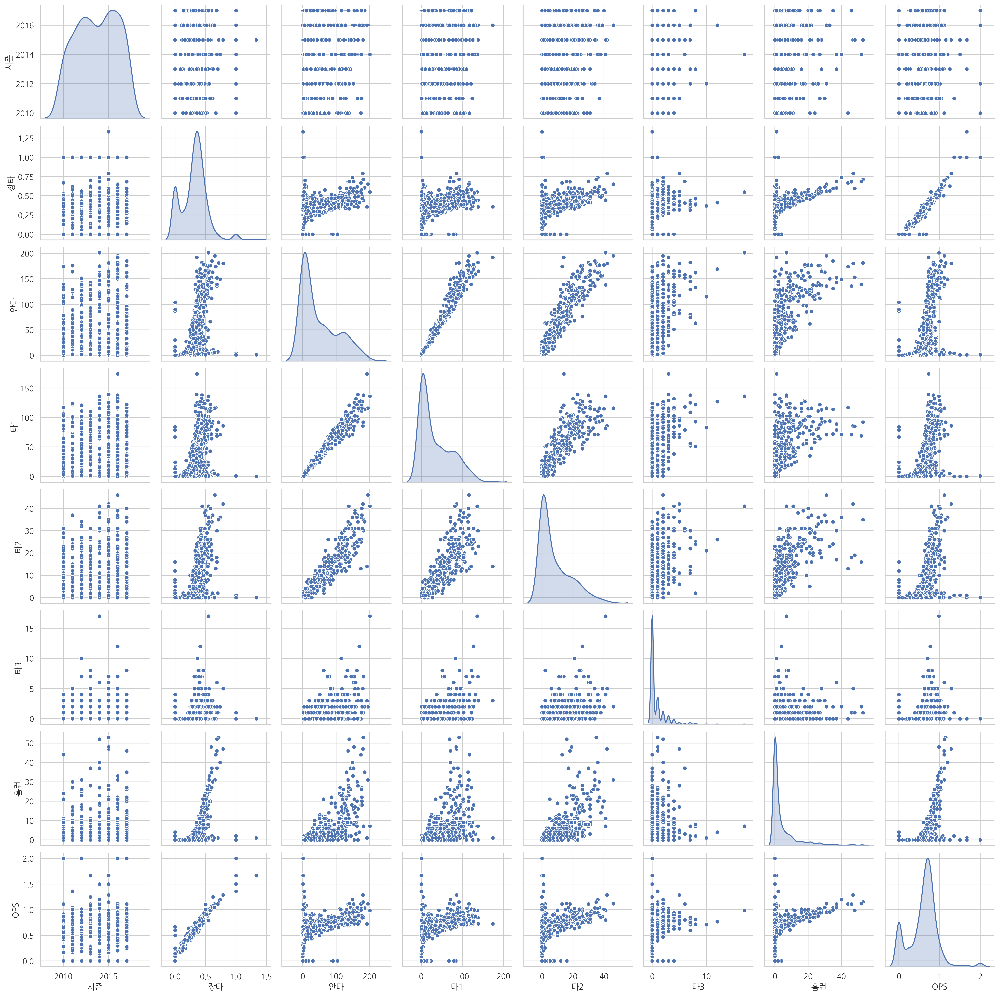

In [60]:
sns.pairplot(train[['시즌', '장타', '안타','타1', '타2', '타3', '홈런', 'OPS']], diag_kind = 'kde') 

plt.show()

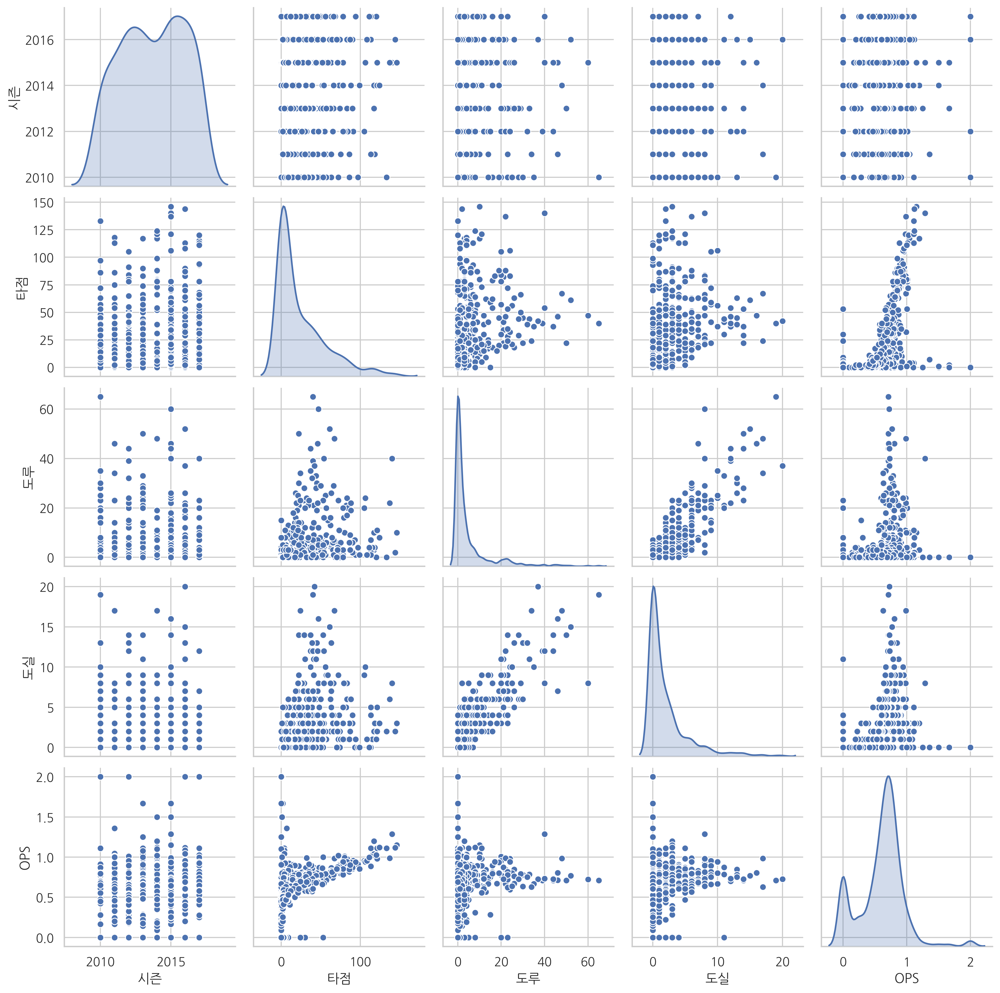

In [61]:
# count 변수들은 튀는 값이 있어도 오류는 아닐 것!
# 튀는 값을 보고 싶으면 시즌 열의 비율 변수 위주로 살펴보기
# 튀는 값 -> MAX 값을 보고 비율 값이면 살펴보기 : OPS
# 선형성(OPS기준) -> 타점. 많이 나가면 OPS가 높다. 관계가 있을듯.
# 예측에는 필요 없지만 선형성 가지는 것 -> 도루-도실,
sns.pairplot(train[['시즌','타점', '도루', '도실',  'OPS']], diag_kind = 'kde') 

plt.show()

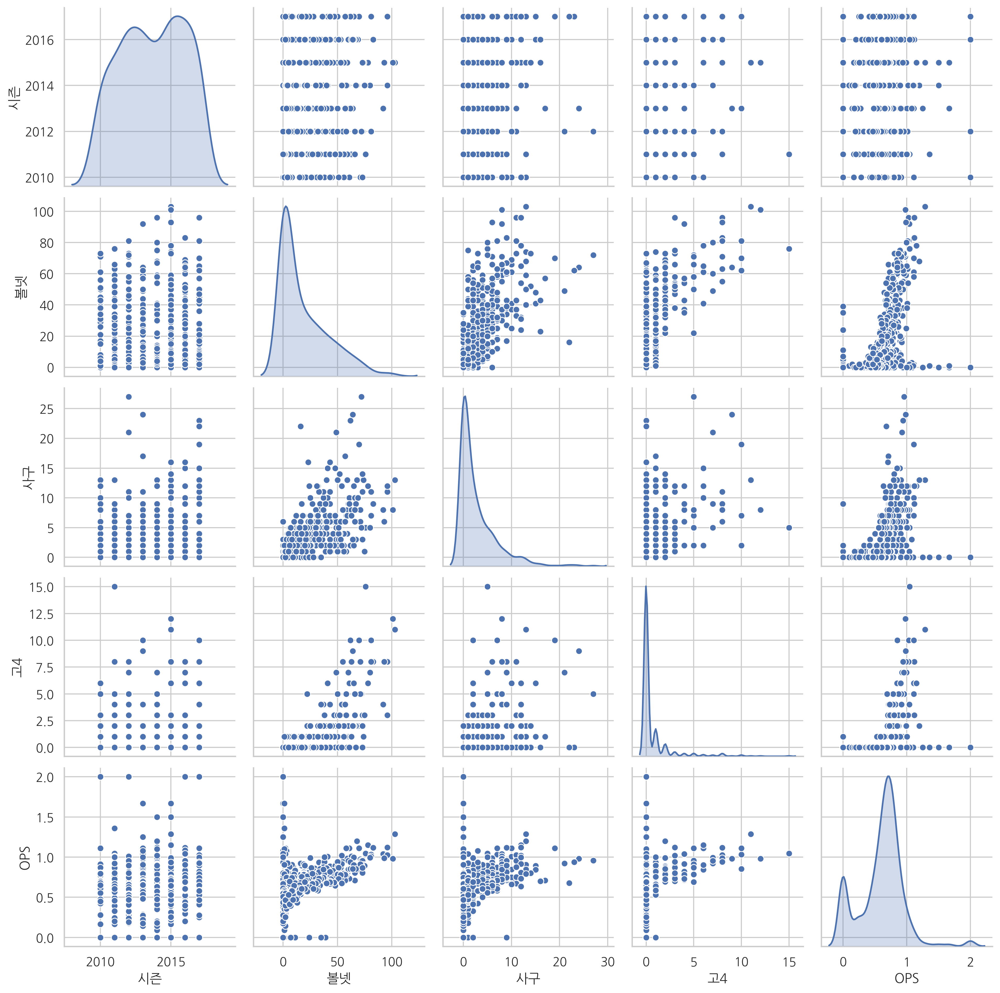

In [62]:
# count 변수들은 튀는 값이 있어도 오류는 아닐 것!
# 튀는 값을 보고 싶으면 시즌 열의 비율 변수 위주로 살펴보기
# 튀는 값 -> MAX 값을 보고 비율 값이면 살펴보기 : OPS
# 선형성(OPS기준) -> 볼넷, 사구 고4
# 예측에는 필요 없지만 선형성 가지는 것 -> 
# 의문 -> 사구랑 고의4구가 관계가 있을 것 같았는데..?

sns.pairplot(train[['시즌', '볼넷', '사구', '고4', 'OPS']], diag_kind = 'kde');


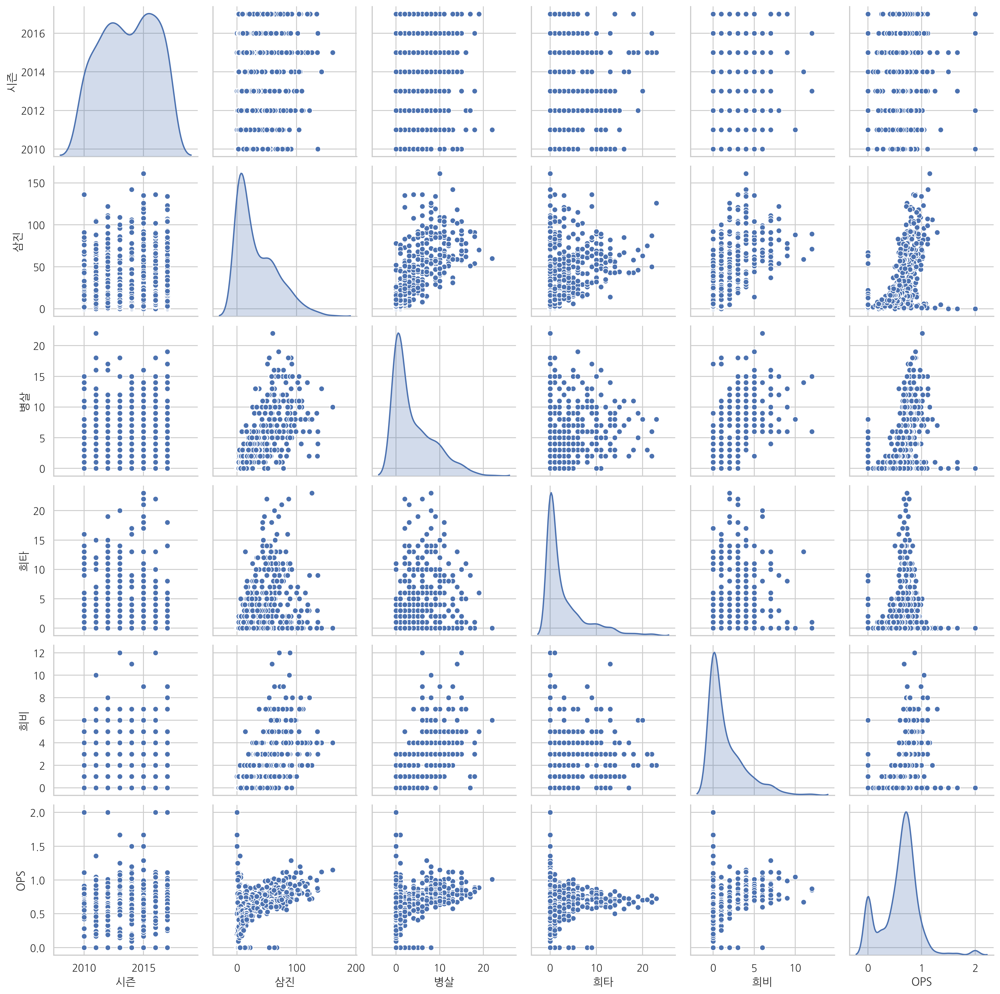

In [63]:
# count 변수들은 튀는 값이 있어도 오류는 아닐 것!
# 튀는 값을 보고 싶으면 시즌 열의 비율 변수 위주로 살펴보기
# 튀는 값 -> MAX 값을 보고 비율 값이면 살펴보기 : OPS
# 선형성(OPS기준) -> 
# 예측에는 필요 없지만 선형성 가지는 것 -> 병살-삼진 (못치나..?)
# 의문 -> 사구랑 고의4구가 관계가 있을 것 같았는데..?

sns.pairplot(train[['시즌','삼진', '병살', '희타', '희비', 'OPS']], diag_kind = 'kde') 

plt.show()

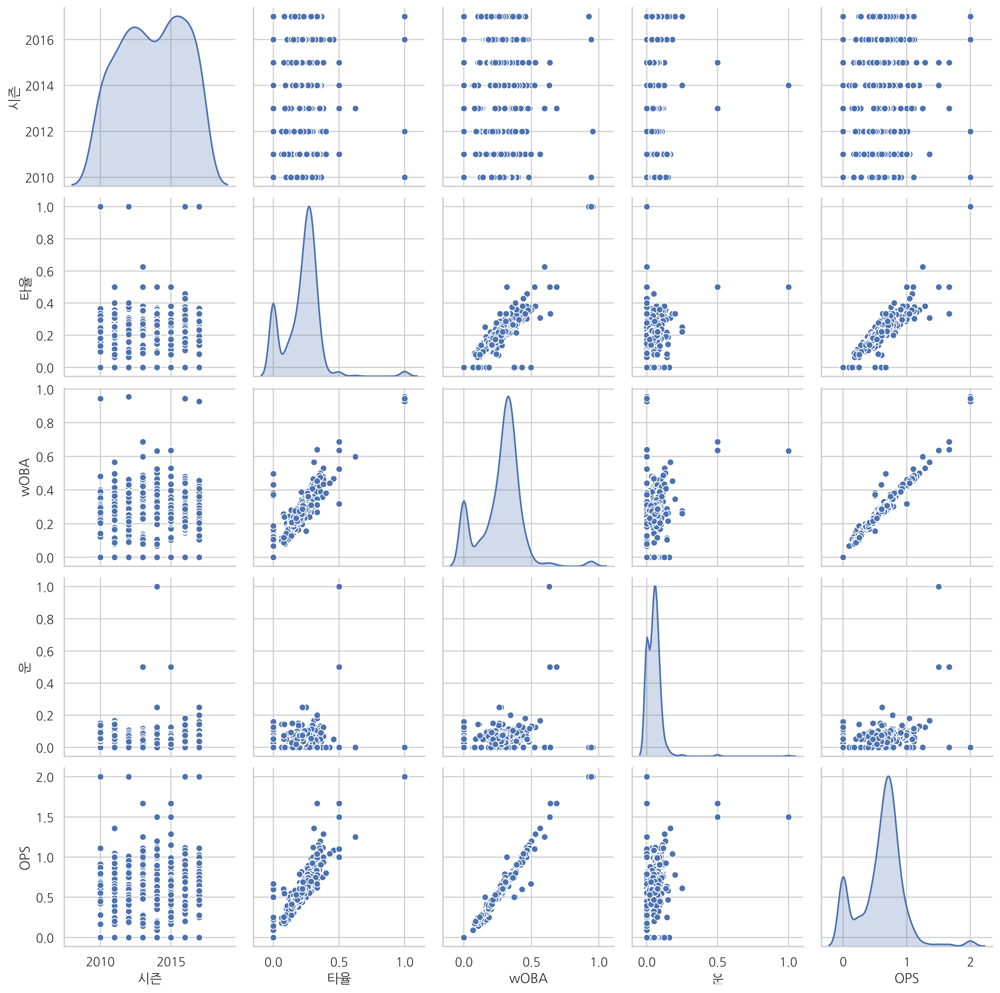

In [64]:
# count 변수들은 튀는 값이 있어도 오류는 아닐 것!
# 튀는 값을 보고 싶으면 시즌 열의 비율 변수 위주로 살펴보기
# 튀는 값 -> MAX 값을 보고 비율 값이면 살펴보기 : 타율, wOba, 운
# 선형성(OPS기준) ->  타율, wOBa (얘네들 값만 잘 처리해도 r-squre높고 조건수 낮아지지 않을런지)
# 예측에는 필요 없지만 선형성 가지는 것 -> woba-삼진
# 의문 -> 타율과 woba는 같이 움직이네..?

sns.pairplot(train[['시즌','타율', 'wOBA', '운' ,  'OPS']], diag_kind = 'kde') 

plt.show()

##### 상관성 높은것만 plotly 로 봐보기.

In [65]:
# 실행 명령어들.
# import plotly standard
import chart_studio.plotly as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
# Cufflinks wrapper on plotly
# import Cufflinks as cf
import cufflinks as cf

# Display all cell outputs
from IPython.core.interactiveshell import InteractiveShell

# plotly + cufflinks in offline mode
from plotly.offline import iplot

cf.go_offline()



# set the global theme

cf.set_config_file(world_readable=True, theme='pearl', offline=True)


In [67]:
# 선형성 높은 값만 넣어서 보기
fig = ff.create_scatterplotmatrix(

    train[['OPS', '타율', 'wRC', '루타', '타점', '안타', '볼넷']],

    height=1000,

    width=1000, 

    diag='box') # scatter, histogram, box



iplot(fig) # offline mode

wOBA    0.988565
장타      0.968644
출루      0.947139
타율      0.937596
wRC+    0.912584
루타      0.513268
타점      0.504015
안타      0.496783
WAR+    0.486278
볼넷      0.486053

#### 회귀분석. 
    -> 변수 다 넣기,VIF 구하기, RMSE 구하기
    - 하지 않은 것 -> 변수 선택, 부분회귀, 변수 선택법(배우지는 않았지만 하면 편할 것 같다. )

In [68]:
col2 = ['타석', '타수','득점', '안타', '1타','2타', '3타', '홈런', '루타', '타점', '도루', '도실', '볼넷', '사구', '고4', '삼진', '병살', '희타', '희비', '타율', '출루', '장타', 'OPS', 'wOBA', 'wRC', 'WAR', '운', '평타1타', '평타2타', '평타3타', '평타총평', '평타루타', '펑타출루']

In [69]:
col_test = ['ID', '이름', '생일', '팀', '시즌', '포지션', '나이', 'G', '타석', '타수',
       '득점', '타1', '타2', '타3', '홈런', '루타', '타점', '도루', '도실', '볼넷', '사구',
       '고4', '삼진', '병살', '희타', '희비', '타율', 'OPS', 'wOBA', 'wRC',
       'WAR', '운', '평타1타', '평타2타', '평타3타', '평타총평', '평타루타', '펑타출루']
col_train = ['ID', '이름', '생일', '팀', '시즌', '포지션', '나이', 'G', '타석', '타수',
       '득점', '타1', '타2', '타3', '홈런', '루타', '타점', '도루', '도실', '볼넷', '사구',
       '고4', '삼진', '병살', '희타', '희비', '타율', 'OPS', 'wOBA', 'wRC',
       'WAR', '운', '평타1타', '평타2타', '평타3타', '평타총평', '평타루타', '펑타출루']
col_summary = ['시즌','나이', 'G', '타석', '타수',
       '득점', '타1', '타2', '타3', '홈런', '루타', '타점', '도루', '도실', '볼넷', '사구',
       '고4', '삼진', '병살', '희타', '희비', '타율', 'OPS', 'wOBA', 'wRC',
       'WAR', '운', '평타1타', '평타2타', '평타3타', '평타총평', '평타루타', '펑타출루']

In [70]:
dfX0 = train[[ 'G', '타석', '타수',
       '득점', '타1', '타2', '타3', '홈런', '루타', '타점', '도루', '도실', '볼넷', '사구',
       '고4', '삼진', '병살', '희타', '희비', '타율', 'OPS', 'wOBA','wRC','WAR', '운', '평타1타', '평타2타', '평타3타', '평타총평', '평타루타', '펑타출루' ]]

In [71]:
import statsmodels.api as sm

In [72]:
dfX = sm.add_constant(dfX0)
dfX
dfX.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 567 entries, 0 to 745
Data columns (total 32 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   const   567 non-null    float64
 1   G       567 non-null    int64  
 2   타석      567 non-null    int64  
 3   타수      567 non-null    int64  
 4   득점      567 non-null    int64  
 5   타1      567 non-null    int64  
 6   타2      567 non-null    int64  
 7   타3      567 non-null    int64  
 8   홈런      567 non-null    int64  
 9   루타      567 non-null    int64  
 10  타점      567 non-null    int64  
 11  도루      567 non-null    int64  
 12  도실      567 non-null    int64  
 13  볼넷      567 non-null    int64  
 14  사구      567 non-null    int64  
 15  고4      567 non-null    int64  
 16  삼진      567 non-null    int64  
 17  병살      567 non-null    int64  
 18  희타      567 non-null    int64  
 19  희비      567 non-null    int64  
 20  타율      567 non-null    float64
 21  OPS     567 non-null    float64
 22  wO

In [76]:
#wRC+, WAR+ 는 변수 변경 하자...ㅠ
# data train, fit은 result_train에 저장
model = sm.OLS.from_formula('OPS ~ G + 타석 + 타수 + 득점 + 타1 + 타2 + 타3 + 홈런 + 타점 + 도루 + 도실 + 볼넷 + 사구 + 고4 + 삼진 + 병살 + 희타 + 희비 + 타율 + wOBA  + wRC + WAR + 운 + 평타1타 + 평타2타 + 평타3타 +평타총평 + 평타루타+펑타출루', data = train)
result_train = model.fit() 
print(result_train.summary())

                            OLS Regression Results                            
Dep. Variable:                    OPS   R-squared:                       0.991
Model:                            OLS   Adj. R-squared:                  0.990
Method:                 Least Squares   F-statistic:                     773.0
Date:                Mon, 30 Mar 2020   Prob (F-statistic):          3.34e-192
Time:                        03:31:11   Log-Likelihood:                 505.39
No. Observations:                 234   AIC:                            -950.8
Df Residuals:                     204   BIC:                            -847.1
Df Model:                          29                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0054      0.009      0.604      0.5

- 이 결과는 제정신이 아닌게 분명하다. 고생을 하자

In [77]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [78]:
# 10 이상이면 공선성 있다고 파악 RMSE 변화 보면서 드롭하기
# 15로 넉넉잡더라도 선택 가능 변수는... G, 도루, 도실, 고4, 삼진, 병살, 타율, wRC+, (WAR+)
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(dfX.values, i) for i in range(dfX.shape[1])]
vif["features"] = dfX.columns
vif

MissingDataError: exog contains inf or nans

In [ ]:
#응 무슨 얘기인지 알겠어...

In [79]:
pd.DataFrame({'column': column, 'VIF': variance_inflation_factor(model.exog, i)} 
             for i, column in enumerate(model.exog_names)
             if column != 'Intercept').sort_values(by = 'VIF',ascending=False)  # 절편의 VIF는 구하지 않는다.

,column,VIF
1,타석,1.292985e+07
2,타수,9.549731e+06
11,볼넷,1.837729e+05
12,사구,6.899527e+03
16,희타,5.821505e+03
17,희비,1.751324e+03
4,타1,1.000768e+02
8,타점,4.600832e+01
3,득점,3.587401e+01
7,홈런,3.478936e+01


- exog가 뭔가 해서 찾아보다가 여기서 vif를 뽑는 방법을 찾음.. 이전 방법은 뭔가 복잡하고 보기가 싫더만. 
- 무턱대고 쓰지 말고 두 방법이 무슨 차이가 있는거고 에러가 왜 나는지 찾아보기.

In [82]:
# RMSE
model = sm.OLS.from_formula('OPS ~ G  +  타1 + 타2 + 타3 +  도루 + 도실 + 고4 + 삼진 + 병살 + 타율 + wOBA  +wRC + WAR ', data = train)
result_train = model.fit()
# print(result.summary())

from sklearn.metrics import mean_squared_error

RMSE = mean_squared_error(test['OPS'], result_train.predict(test))**0.5
RMSE

0.031279758835492284

In [83]:
model = sm.OLS.from_formula('OPS ~ G + 타석 + 타수 + 득점 + 타1 + 타2 + 타3  + 타점 + 도루 + 도실 + 볼넷 + 사구 + 고4 + 삼진 + 병살 + 희타 + 희비 + 타율 + wOBA +wRC + WAR', data = train)
result_train = model.fit()
# print(result.summary())

# RMSE
from sklearn.metrics import mean_squared_error

RMSE = mean_squared_error(test['OPS'], result_train.predict(test))**0.5
RMSE

0.027749536875119375

In [84]:
print(result_train.summary())

                            OLS Regression Results                            
Dep. Variable:                    OPS   R-squared:                       0.987
Model:                            OLS   Adj. R-squared:                  0.986
Method:                 Least Squares   F-statistic:                     1946.
Date:                Mon, 30 Mar 2020   Prob (F-statistic):               0.00
Time:                        03:35:56   Log-Likelihood:                 1027.7
No. Observations:                 567   AIC:                            -2011.
Df Residuals:                     545   BIC:                            -1916.
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0104      0.005      1.979      0.0

- VIF 값에 따라 변수 선택하니 RMSE가 높아진다.
- 계수 선택도 안되고 조건수도 높고...
- ㅠㅠ

#### OPS에 대한 부분 회귀 하기 - 내일
- 찾아볼 것 - 부분 회귀랑 그리는 scatterplot과 어떤 차이가 있는가?
- 부분회귀에서 선형성을 가진다는 의미는?